# Comprensión de los datos

In [25]:
import os
import csv
import statistics
from collections import Counter
from datetime import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt, math
import seaborn as sns

print("✅ ¡Todas las librerías fueron importadas correctamente!")
print("✅ Listo para continuar con el análisis")

✅ ¡Todas las librerías fueron importadas correctamente!
✅ Listo para continuar con el análisis


1. Recolección de datos iniciales

In [26]:
# =============================================================================
# EXPLORAR ARCHIVO: base_datos_completa_NNA_TI_anon.xlsx
# =============================================================================

print("📂 Cargando archivo base_datos_completa_NNA_TI_anon.xlsx...")

# Cargar el archivo Excel
df = pd.read_excel('/content/base_datos_completa_NNA_TI_anon.xlsx', sheet_name=1)

print(f"✅ Archivo cargado exitosamente!")
print(f"\n{'='*70}")
print("👀 PRIMERAS 5 FILAS:")
print(f"{'='*70}")
display(df.head())

📂 Cargando archivo base_datos_completa_NNA_TI_anon.xlsx...
✅ Archivo cargado exitosamente!

👀 PRIMERAS 5 FILAS:


,Id_fic,Base_Origen,Ficha_fic,Fecha_intervencion,Localidad_fic,Red_fic,Usuario,TIPO_INTERVENCION,PERFIL,TIPO INTERVENCIÓN,...,"INTERVENCIÓN DE NIÑO, NIÑA O ADOLESCENTE QUE TERMINA EL PROCESO",FECHA - SEGUIMIENTO CIERRE,NNA DESVINCULADO DE LA ACTIVIDAD LABORAL,"Sub-Sección => Intervención de Niño, Niña o Adolescente",Sub-Sección => RESULTADOS DE LA INTERVENCIÓN,ADOLESCENTE TRABAJO PROTEGIDO,Sub-Sección => RESULTADOS DE LA REPOSICION,FECHA - REPOSICIÓN DE PSICÓLOGO O TRABAJADOR SOCIAL POSTERIOR AL SEGUIMIENTO - CIERRE,NNA DESVINCULADO DE LA ACTIVIDAD LABORAL.1,ADOLESCENTE TRABAJO PROTEGIDO.1
0,1977498,dic24_mar25,3190244966,2024-12-05,Ciudad Bolívar,Sur,rapalencia,99999,Tecnólogo en Salud Ocupacional,2. Niños - Niñas,...,Si,2025-02-21 00:00:00,No,99999,99999,99999,99999,2023-10-13 00:00:00,99999,99999
1,1977499,dic24_mar25,3190244967,2024-12-05,Ciudad Bolívar,Sur,estellez,99999,Tecnólogo en Salud Ocupacional,2. Niños - Niñas,...,Si,2025-02-21 00:00:00,Si,99999,99999,99999,99999,2023-10-13 00:00:00,99999,99999
2,1977500,dic24_mar25,3190244968,2024-12-05,Ciudad Bolívar,Sur,fecelis,99999,Tecnólogo en Salud Ocupacional,2. Niños - Niñas,...,Si,2025-02-21 00:00:00,Si,99999,99999,99999,99999,2023-10-13 00:00:00,99999,99999
3,1977544,dic24_mar25,3060244894,2024-12-04,Tunjuelito,Sur,smroncancio,99999,Tecnólogo en Salud Ocupacional,2. Niños - Niñas,...,Si,2025-02-26 00:00:00,Si,99999,99999,99999,99999,2023-10-13 00:00:00,99999,99999
4,1977549,dic24_mar25,3190244965,2024-12-05,Ciudad Bolívar,Sur,rapalencia,99999,Tecnólogo en Salud Ocupacional,2. Niños - Niñas,...,Si,2025-02-21 00:00:00,No,99999,99999,99999,99999,2023-10-13 00:00:00,99999,99999


2. Describir los datos

In [ ]:
print(f"\n{'='*70}")
print("📊 INFORMACIÓN GENERAL DEL ARCHIVO")
print(f"{'='*70}")
print(f"Número de filas: {len(df)}")
print(f"Número de columnas: {len(df.columns)}")

print(f"\n{'='*70}")
print("📋 COLUMNAS DISPONIBLES:")
print(f"{'='*70}")
for i, col in enumerate(df.columns, 1):
    print(f"{i:2d}. {col}")

print(f"\n{'='*70}")
print("📈 TIPOS DE DATOS:")
print(f"{'='*70}")
print(df.dtypes)


📊 INFORMACIÓN GENERAL DEL ARCHIVO
Número de filas: 56473
Número de columnas: 115

📋 COLUMNAS DISPONIBLES:
 1. Id_fic
 2. Base_Origen
 3. Ficha_fic
 4. Fecha_intervencion
 5. Localidad_fic
 6. Red_fic
 7. Usuario
 8. TIPO_INTERVENCION
 9. PERFIL
10. TIPO INTERVENCIÓN
11. .INFORMACIÓN DEL MENOR.
12. Sub-Sección => INFORMACIÓN DEL MENOR NNA IDENTIFICADO COMO TRABAJADOR
13. NACIONALIDAD
14. SEXO
15. GENERO
16. ESTADO CIVIL
17. FECHA DE NACIMIENTO
18. EDAD
19. CURSO DE VIDA
20. ETNIA
21. POBLACIÓN DIFERENCIAL Y DE INCLUSIÓN
22. .Personas a Cargo.
23. OCUPACIÓN
24. IdNivelEducativo
25. RazonAbandonoEscolar
26. CATEGORÍAS DE LA DISCAPACIDAD
27. HABLA ESPAÑOL
28. PUEBLO
29. VÍNCULO CON EL JEFE DE HOGAR
30. AFILIACIÓN AL SGSSS
31. NOMBRE EAPB
32. DIRECCIÓN DE LA VIVIENDA
33. ZONA
34. ESPECIAL
35. LOCALIDAD
36. UPZ/UPR
37. BARRIO
38. BARRIO PRIORIZADO
39. MANZANA DEL CUIDADO
40. NUMERO DE MANZANA DEL CUIDADO
41. ESTRATO
42. SUBGRUPO SISBEN
43. TELÉFONO 1
44. TELÉFONO 2
45. VEREDA
46. CORREO  1


3. Exploración de datos

In [ ]:
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()

print(f"\n{'='*70}")
print("📊 VARIABLES NUMÉRICAS:")
print(f"{'='*70}")
if numeric_cols:
    for i, col in enumerate(numeric_cols, 1):
        print(f"{i:2d}. {col}")


📊 VARIABLES NUMÉRICAS:
 1. Id_fic
 2. Ficha_fic
 3. .INFORMACIÓN DEL MENOR.
 4. Sub-Sección => INFORMACIÓN DEL MENOR NNA IDENTIFICADO COMO TRABAJADOR
 5. EDAD
 6. .Personas a Cargo.
 7. DIRECCIÓN DE LA VIVIENDA
 8. ESPECIAL
 9. UPZ/UPR
10. TELÉFONO 2
11. ÚLTIMA INTERVENCIÓN
12. NÚMERO DE FICHA ANTERIOR
13. Sub-Sección => INFORMACIÓN DEL ACUDIENTE
14. Sub-Sección => INFORMACIÓN LABORAL
15. ESPECIAL.1
16. UPZ/UPR.1
17. ACOMPAÑAMIENTO 2
18. ACOMPAÑAMIENTO 3
19. ACOMPAÑAMIENTO 4
20. PESO
21. TALLA_CM
22. Sub-Sección => Intervención de Niño, Niña o Adolescente
23. Sub-Sección => RESULTADOS DE LA INTERVENCIÓN
24. Sub-Sección => RESULTADOS DE LA REPOSICION


In [ ]:
resumen = df.select_dtypes(include=['int64', 'float64']).describe()

print(f"\n{'='*70}")
print("📊 RESUMEN ESTADÍSTICO DE LAS VARIABLES NUMÉRICAS:")
print(f"{'='*70}")
print(resumen)


📊 RESUMEN ESTADÍSTICO DE LAS VARIABLES NUMÉRICAS:
             Id_fic     Ficha_fic  .INFORMACIÓN DEL MENOR.  \
count  5.647300e+04  5.647300e+04             56473.000000   
mean   1.097819e+06  8.296296e+09            110344.386769   
std    6.711939e+05  1.403596e+10             48690.588526   
min    1.549760e+05  2.030271e+08                 0.000000   
25%    4.288560e+05  1.120242e+09             99999.000000   
50%    1.082024e+06  2.180258e+09             99999.000000   
75%    1.786453e+06  3.190256e+09             99999.000000   
max    2.061436e+06  4.160223e+10            415721.000000   

       Sub-Sección => INFORMACIÓN DEL MENOR NNA IDENTIFICADO COMO TRABAJADOR  \
count                                            56473.0                       
mean                                             99999.0                       
std                                                  0.0                       
min                                              99999.0              


📊 HISTOGRAMAS DE VARIABLES NUMÉRICAS:


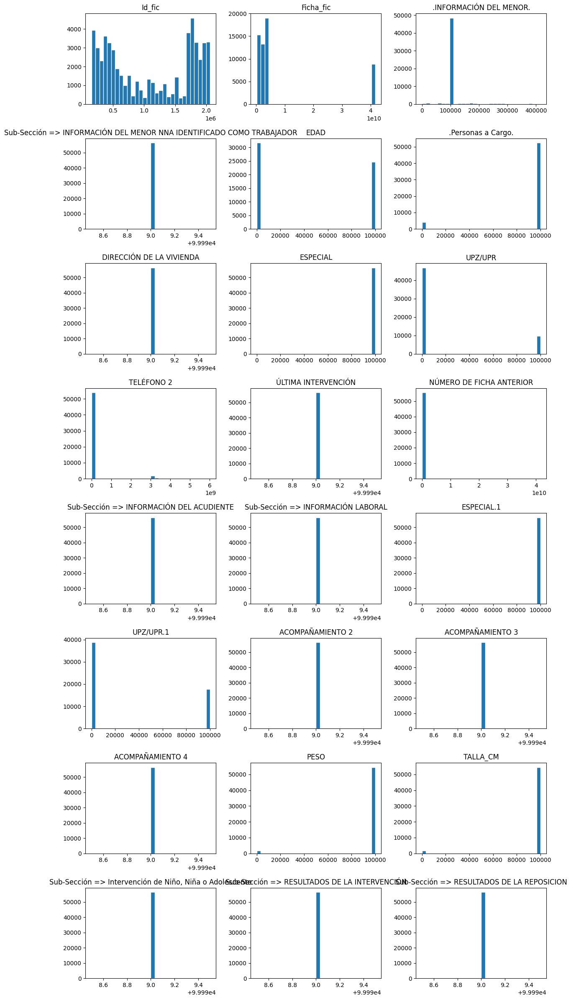

In [ ]:
num = df.select_dtypes('number')
r = math.ceil(num.shape[1] / 3)            # filas (3 por fila)
num.hist(bins=30, layout=(r, 3), figsize=(12, 3*r),
         grid=False, edgecolor='white', sharex=False)

print(f"\n{'='*70}")
print("📊 HISTOGRAMAS DE VARIABLES NUMÉRICAS:")
print(f"{'='*70}")
plt.tight_layout(); plt.show()

In [ ]:
cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

print(f"\n{'='*70}")
print("🔖 VARIABLES CATEGÓRICAS:")
print(f"{'='*70}")
for i, col in enumerate(cat_cols, 1):
        print(f"{i:2d}. {col}")


🔖 VARIABLES CATEGÓRICAS:
 1. Base_Origen
 2. Localidad_fic
 3. Red_fic
 4. Usuario
 5. TIPO_INTERVENCION
 6. PERFIL
 7. TIPO INTERVENCIÓN
 8. NACIONALIDAD
 9. SEXO
10. GENERO
11. ESTADO CIVIL
12. FECHA DE NACIMIENTO
13. CURSO DE VIDA
14. ETNIA
15. POBLACIÓN DIFERENCIAL Y DE INCLUSIÓN
16. OCUPACIÓN
17. IdNivelEducativo
18. RazonAbandonoEscolar
19. CATEGORÍAS DE LA DISCAPACIDAD
20. HABLA ESPAÑOL
21. PUEBLO
22. VÍNCULO CON EL JEFE DE HOGAR
23. AFILIACIÓN AL SGSSS
24. NOMBRE EAPB
25. ZONA
26. LOCALIDAD
27. BARRIO
28. BARRIO PRIORIZADO
29. MANZANA DEL CUIDADO
30. NUMERO DE MANZANA DEL CUIDADO
31. ESTRATO
32. SUBGRUPO SISBEN
33. TELÉFONO 1
34. VEREDA
35. CORREO  1
36. CORREO  2
37. FECHA DE LA ÚLTIMA INTERVENCIÓN
38. AFILIACIÓN AL SGSSS.1
39. NOMBRE EAPB.1
40. ESTRATO SOCIOECONÓMICO
41. DIRECCIÓN DEL TRABAJO
42. ZONA.1
43. LOCALIDAD.1
44. BARRIO.1
45. BARRIO PRIORIZADO.1
46. MANZANA DEL CUIDADO.1
47. NUMERO DE MANZANA DEL CUIDADO.1
48. NOMBRE DE LA UT
49. ¿EN DONDE REALIZA PRINCIPALMENTE SU

In [ ]:
print(f"\n{'='*100}")
print("🔖 RESUMEN DE COLUMNAS CATEGÓRICAS: NÚMERO DE CATEGORÍAS ÚNICAS Y FRECUENCIA DE CADA CATEGORÍA:")
print(f"{'='*100}")

for col in df.select_dtypes(include=['object', 'category']).columns:
    print(f"\nColumna: {col}")
    print("Número de categorías únicas:", df[col].nunique())
    print("Frecuencia de categorías:\n", df[col].value_counts())


🔖 RESUMEN DE COLUMNAS CATEGÓRICAS: NÚMERO DE CATEGORÍAS ÚNICAS Y FRECUENCIA DE CADA CATEGORÍA:

Columna: Base_Origen
Número de categorías únicas: 5
Frecuencia de categorías:
 Base_Origen
MARZO2023_NOVI 2024    23672
nov21_sep08_2022       11165
marzo_octubre 2021      8900
sep09_2022_mar2023      8075
dic24_mar25             4661
Name: count, dtype: int64

Columna: Localidad_fic
Número de categorías únicas: 20
Frecuencia de categorías:
 Localidad_fic
Ciudad Bolívar        7957
Bosa                  5774
Kennedy               5431
Suba                  4931
Usme                  3930
Engativá              3810
Rafael Uribe Uribe    3168
Los Mártires          3161
San Cristóbal         3106
Santa fe              2809
Barrios Unidos        2670
Tunjuelito            2206
Usaquén               2175
Antonio Nariño        2067
Puente Aranda         1365
Fontibón              1228
Candelaria             341
Teusaquillo            236
Chapinero              107
Sumapaz                  1
Name


🔖 DISTRIBUCIONES DE VARIABLES CATEGÓRICAS:


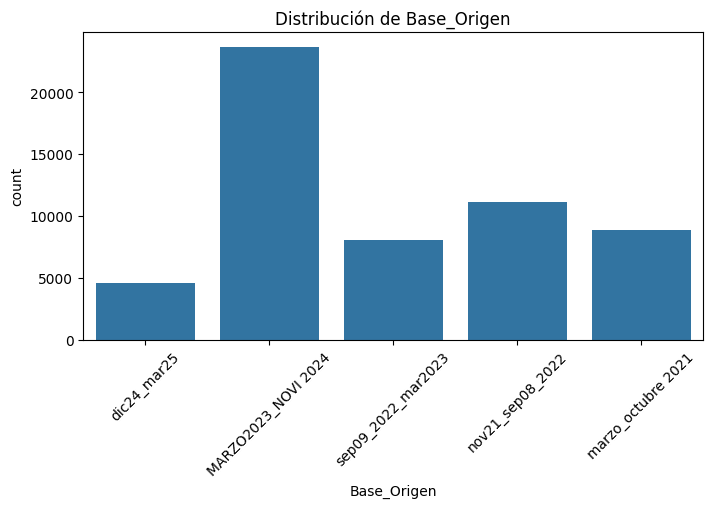

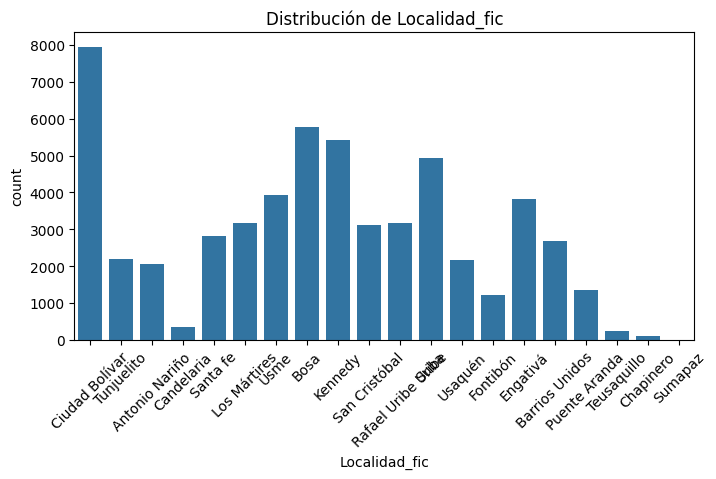

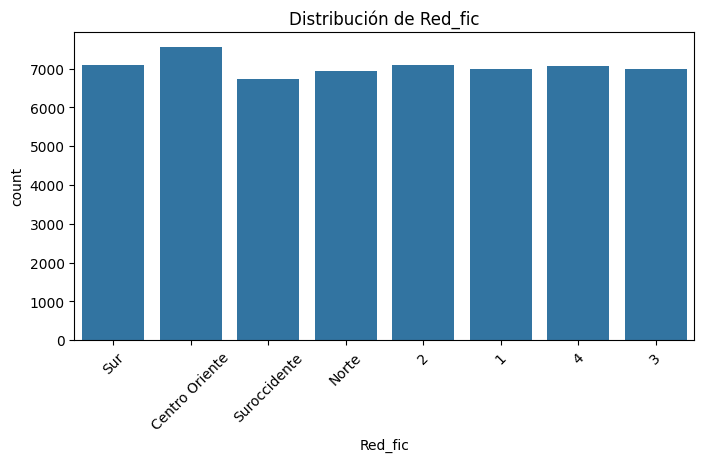

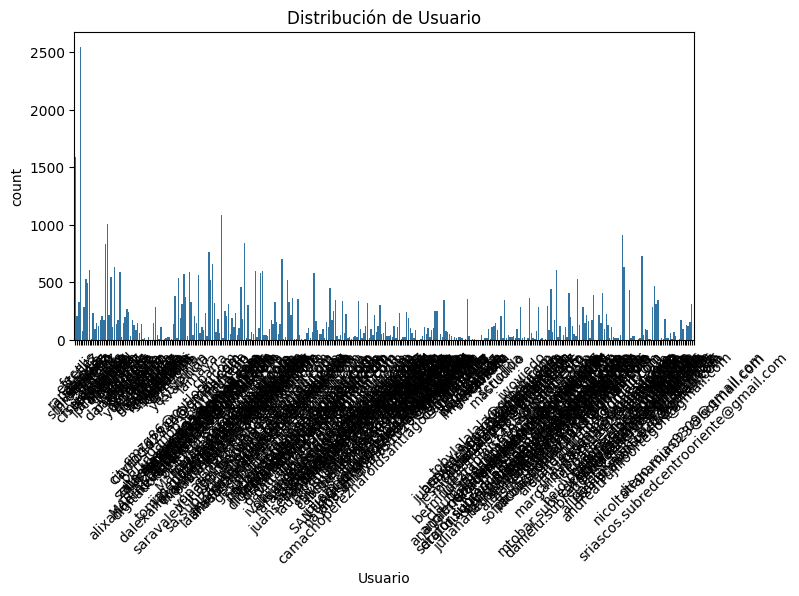

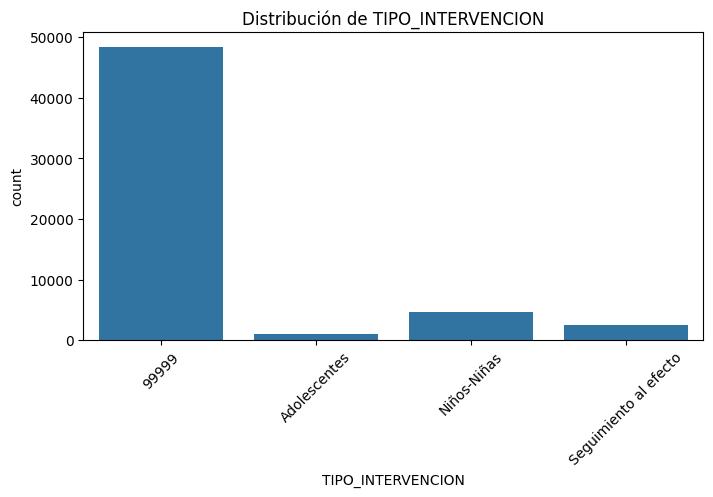

...

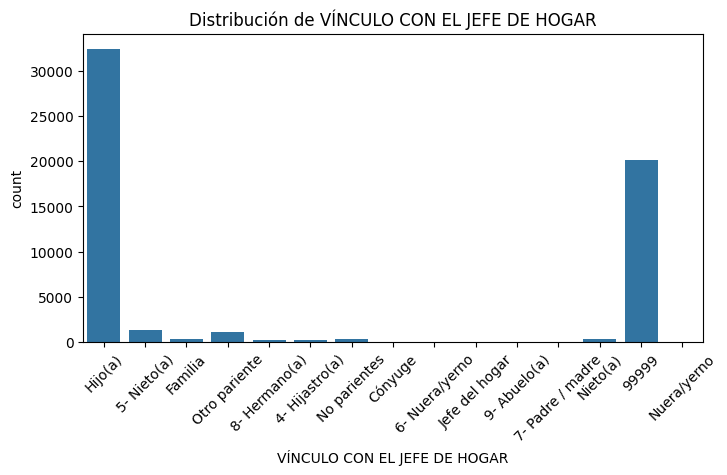

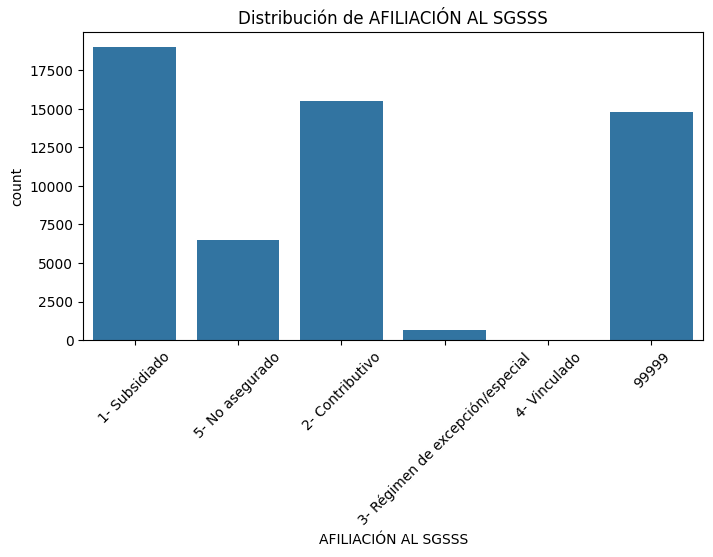

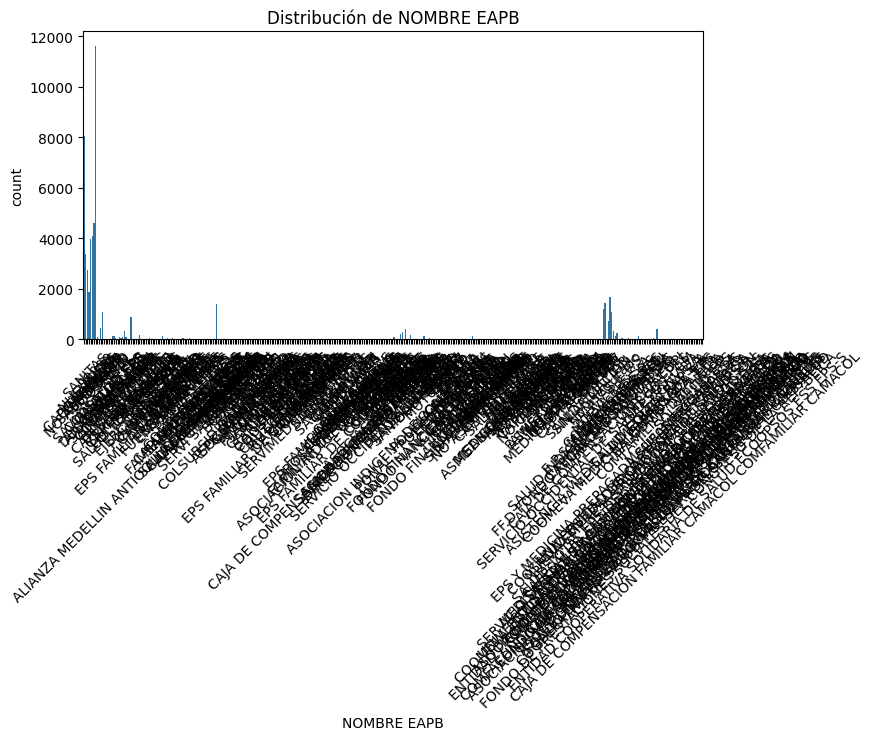

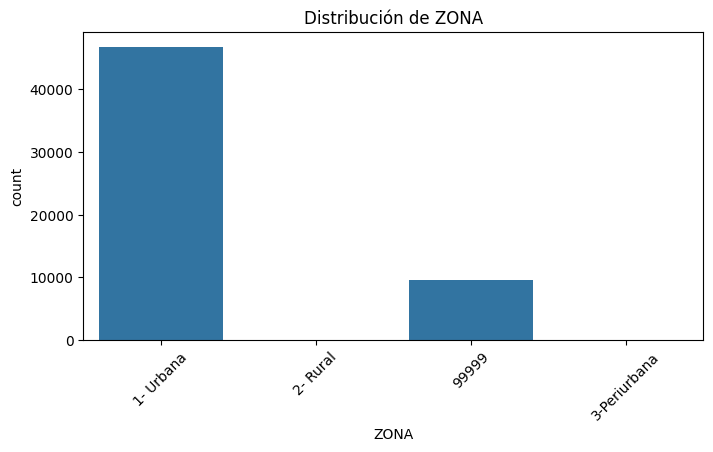

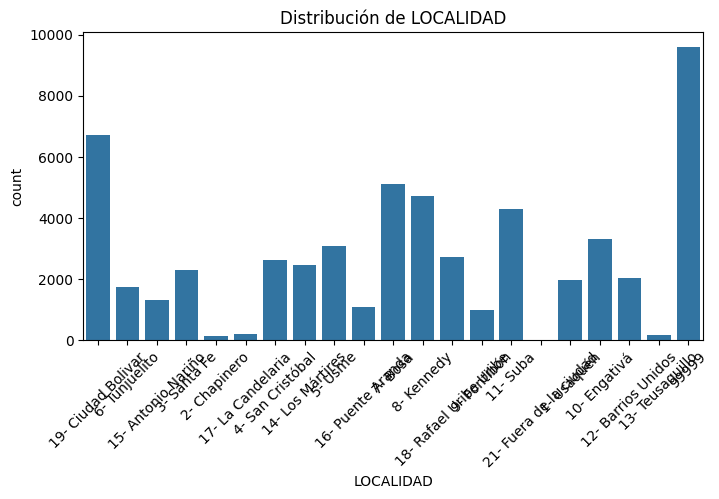

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


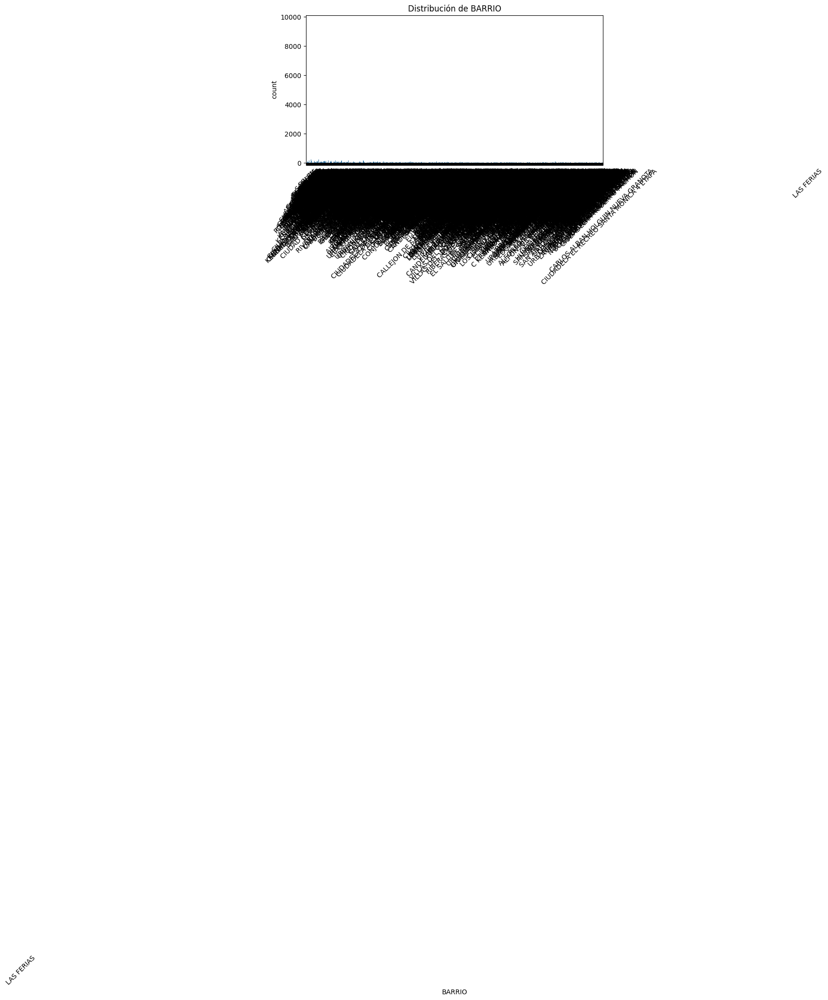

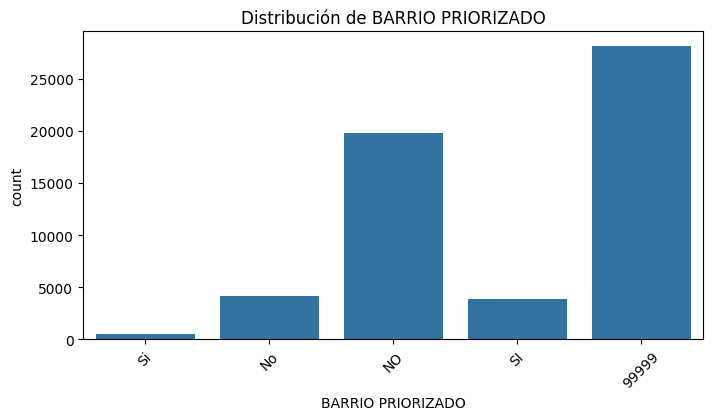

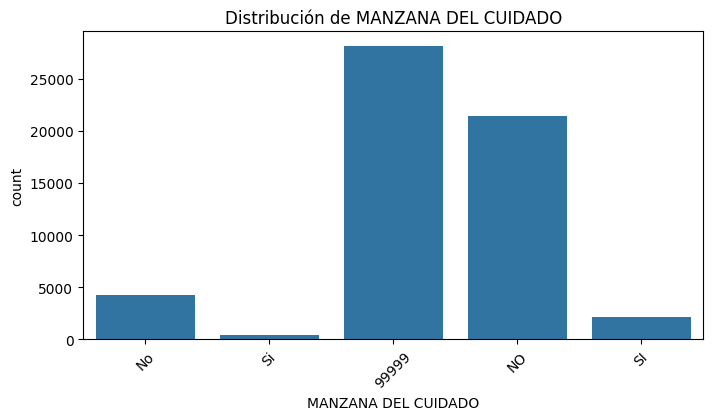

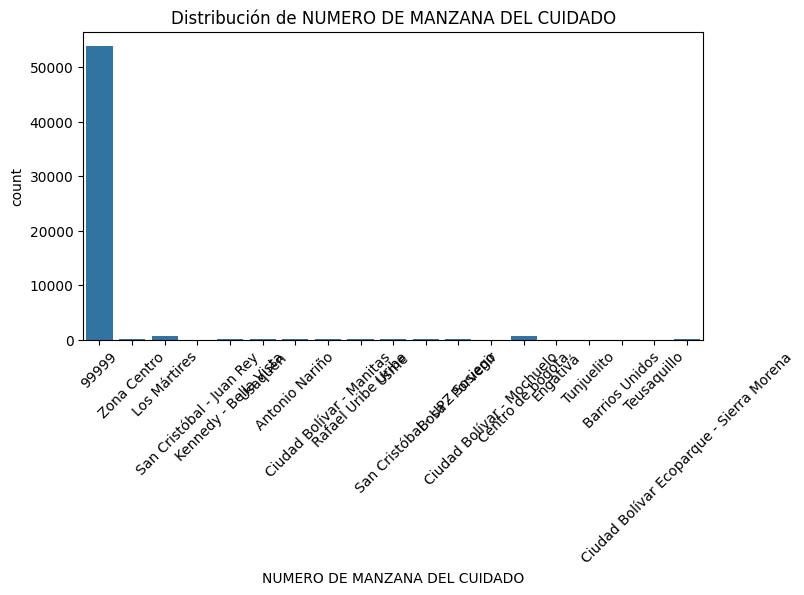

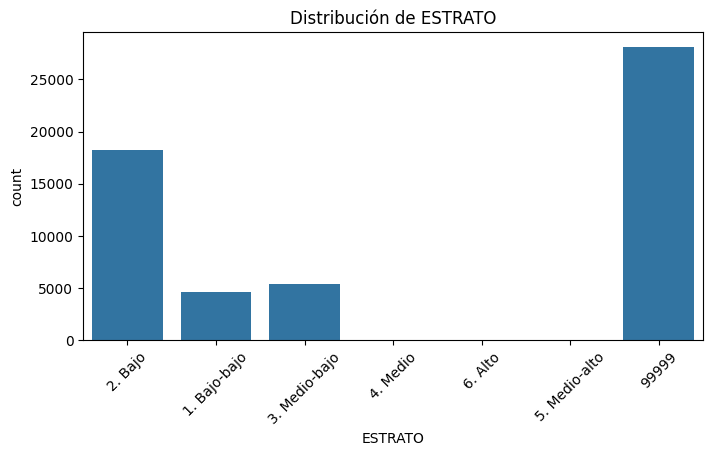

...

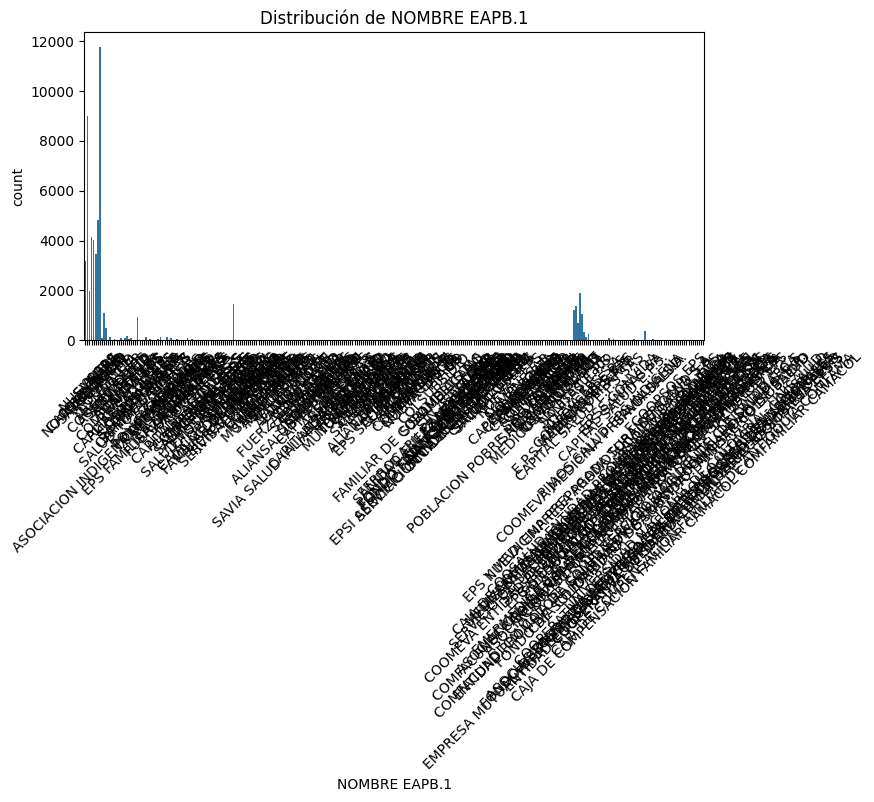

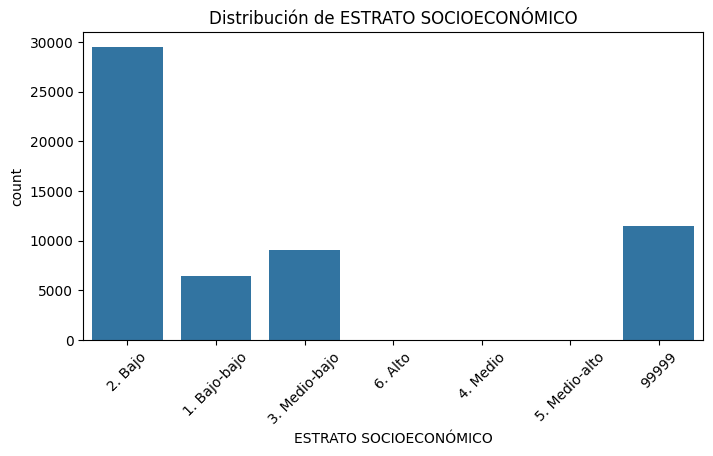

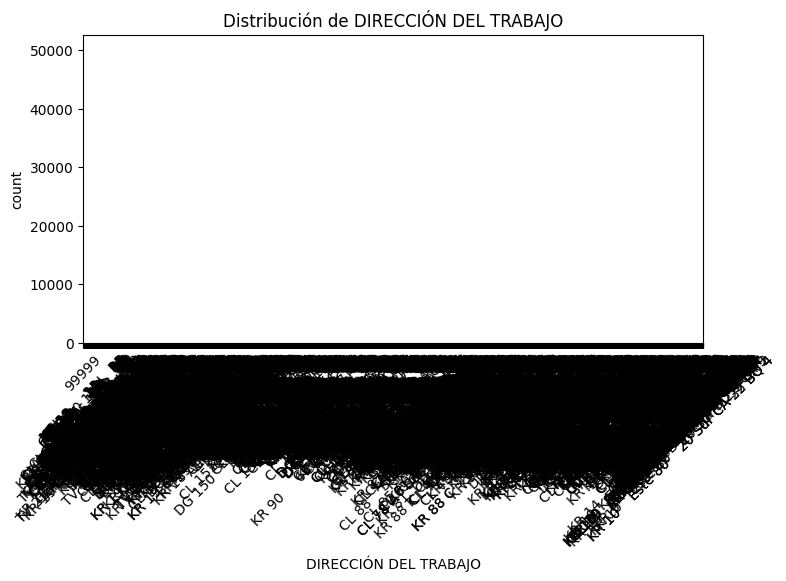

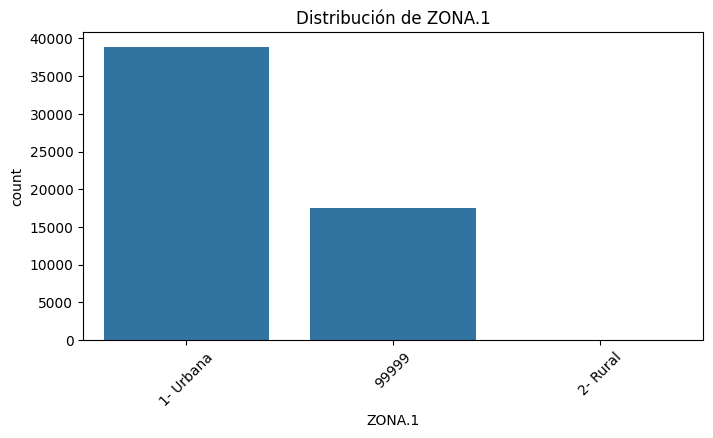

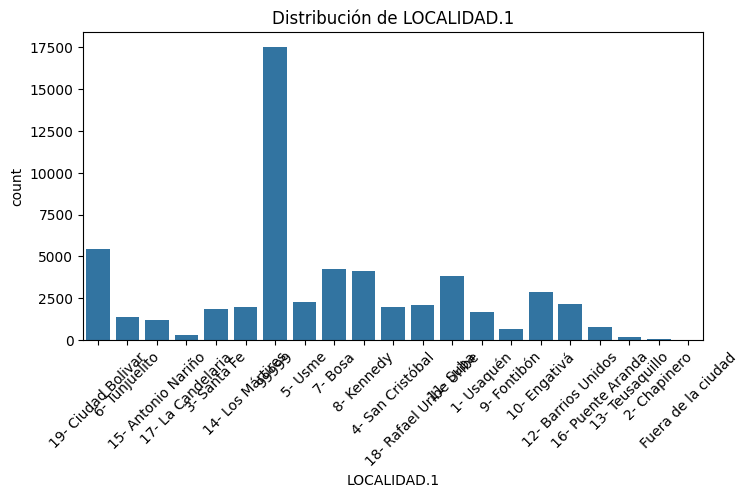

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


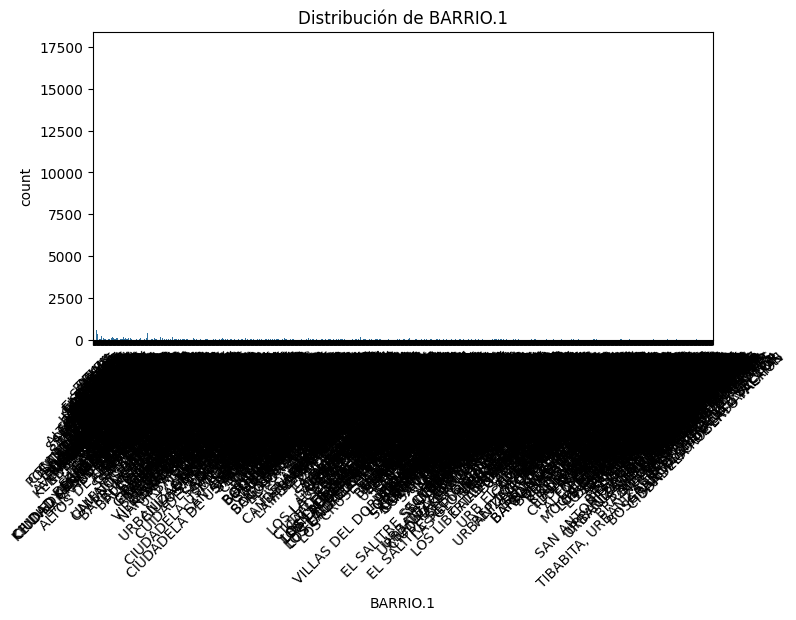

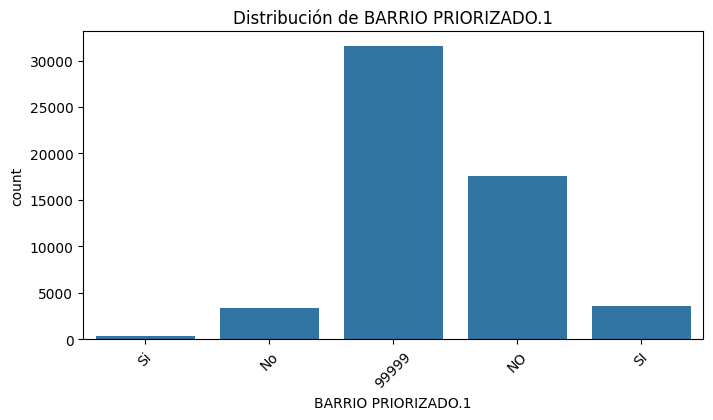

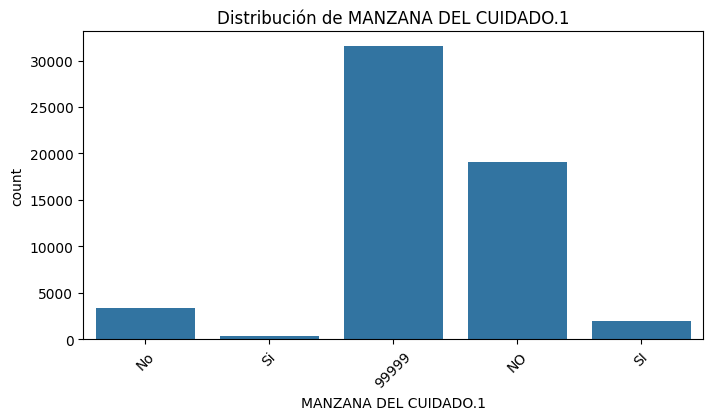

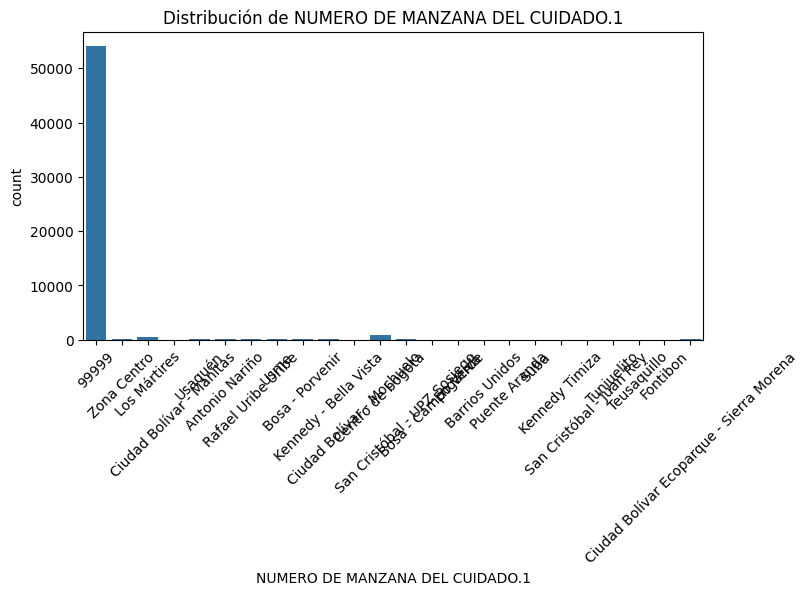

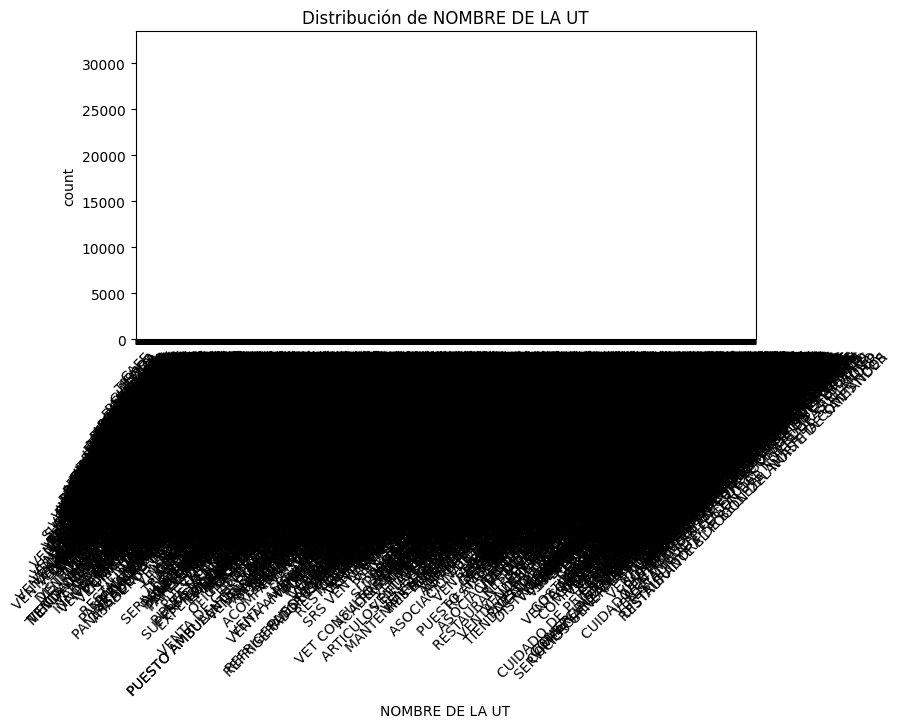

...

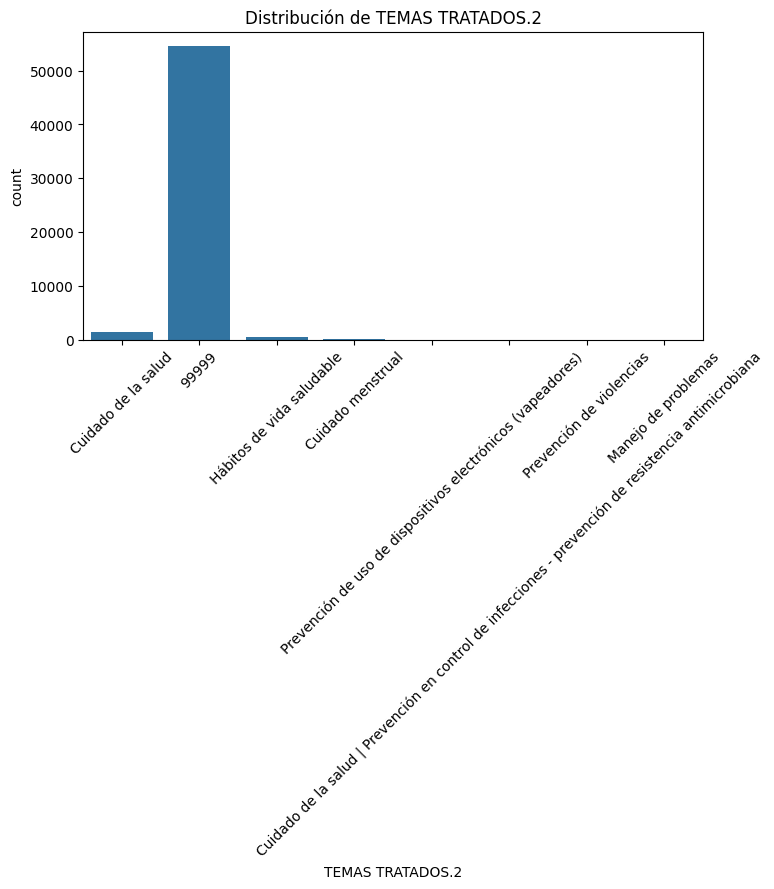

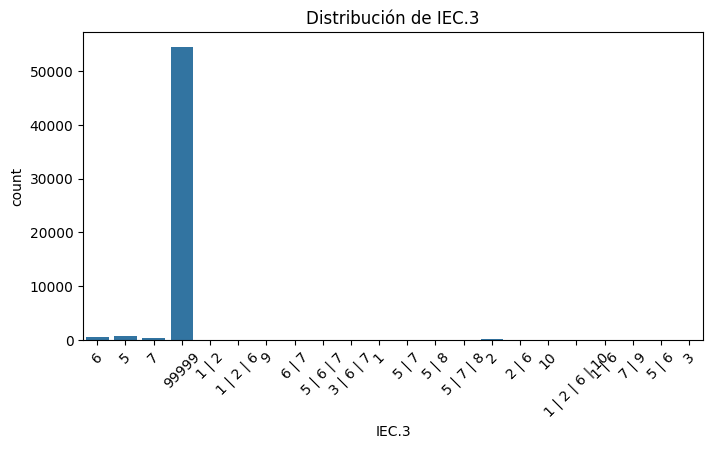

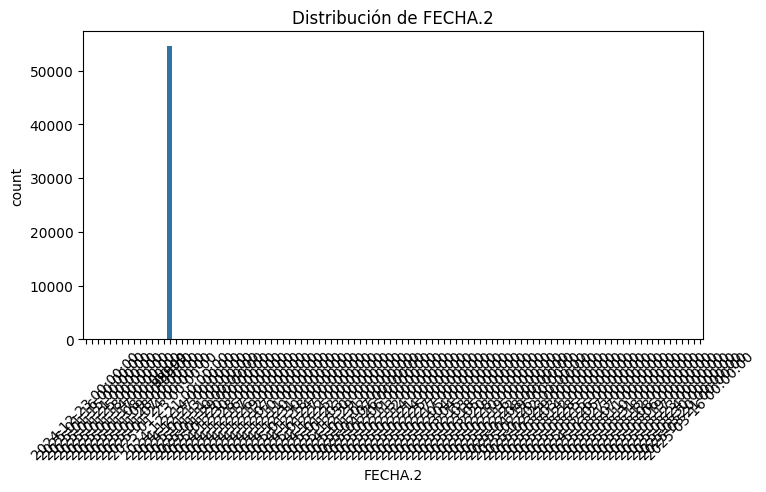

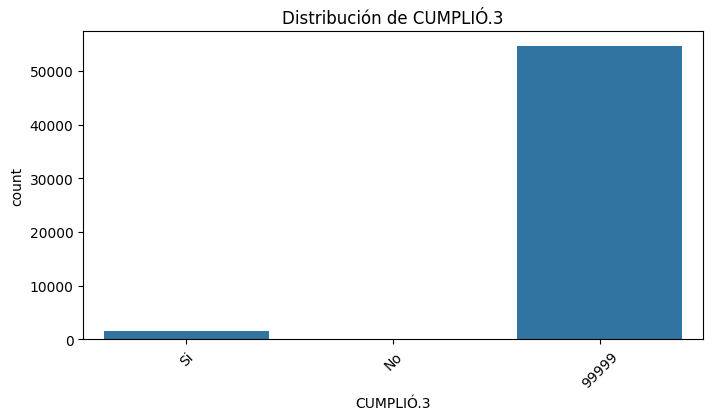

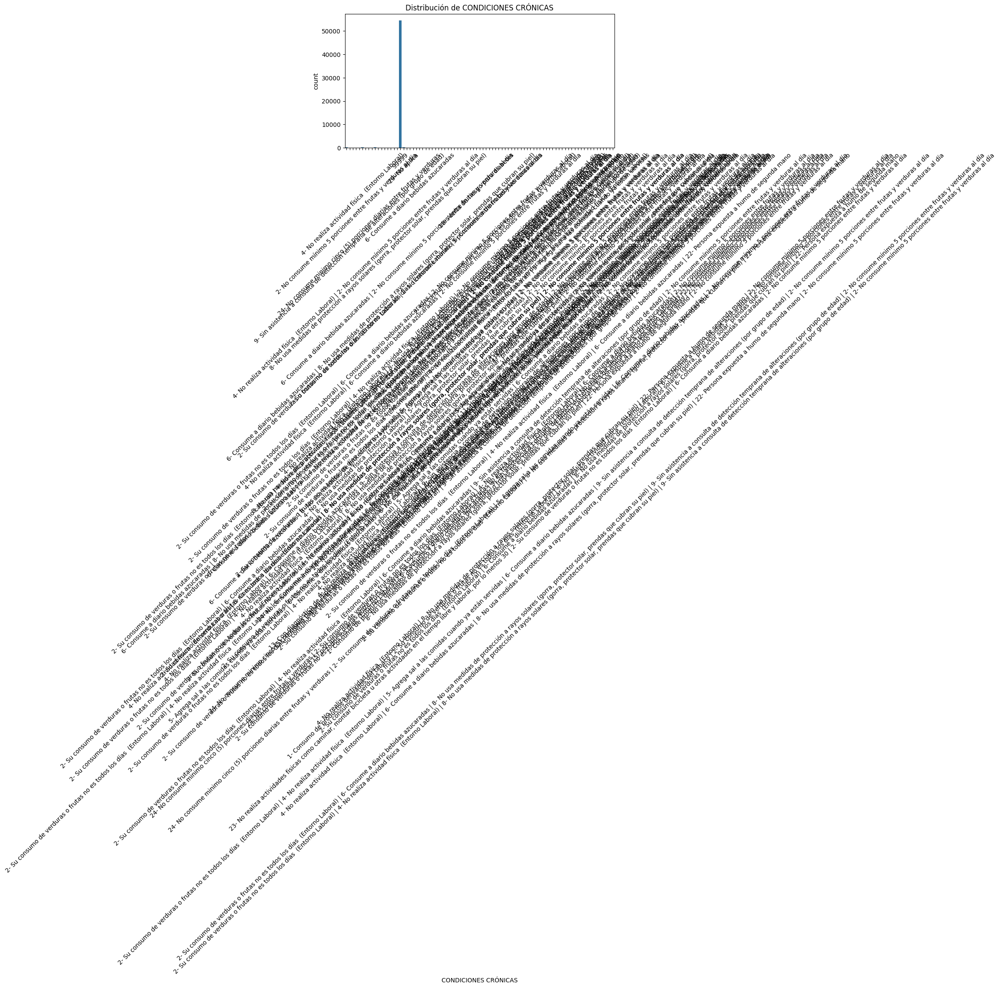

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


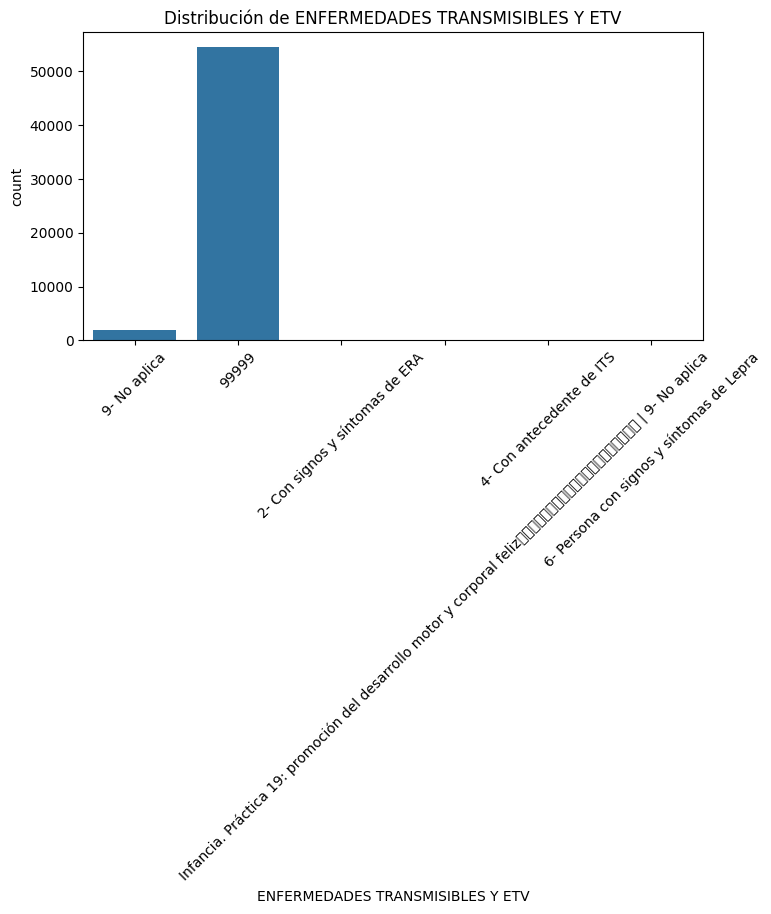

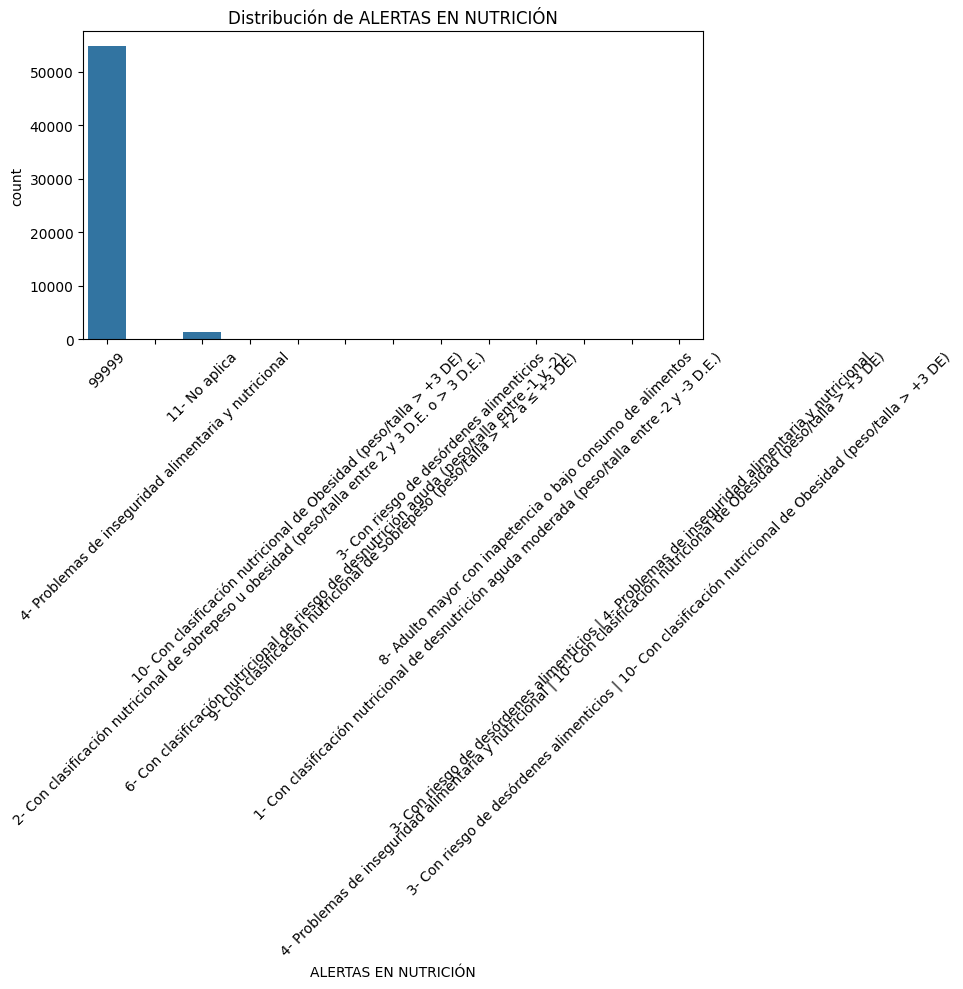

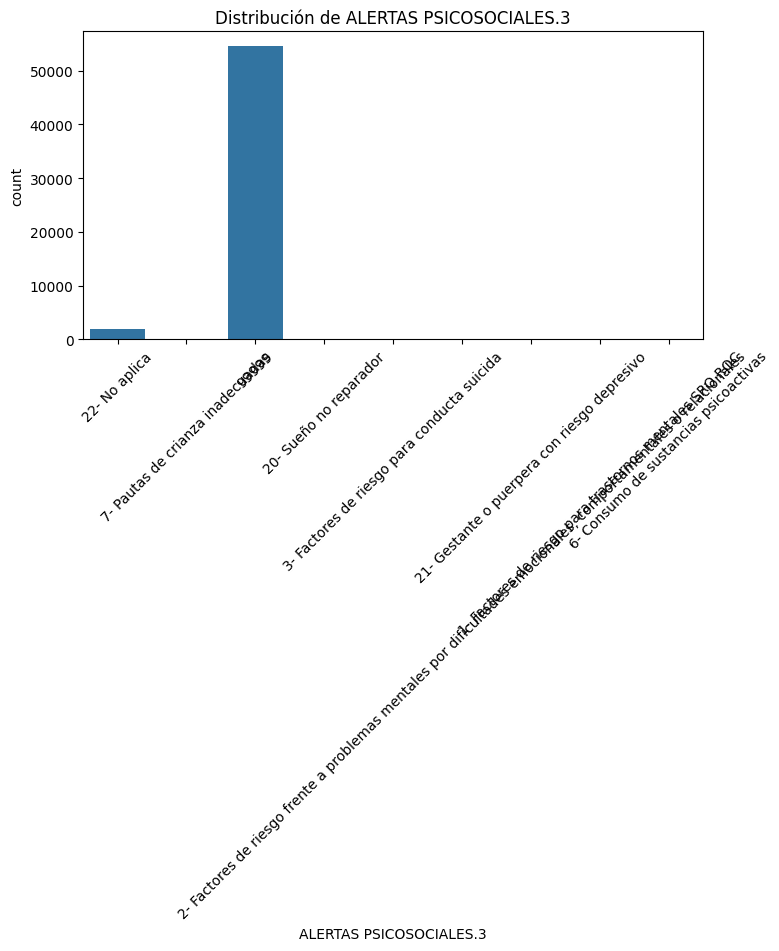

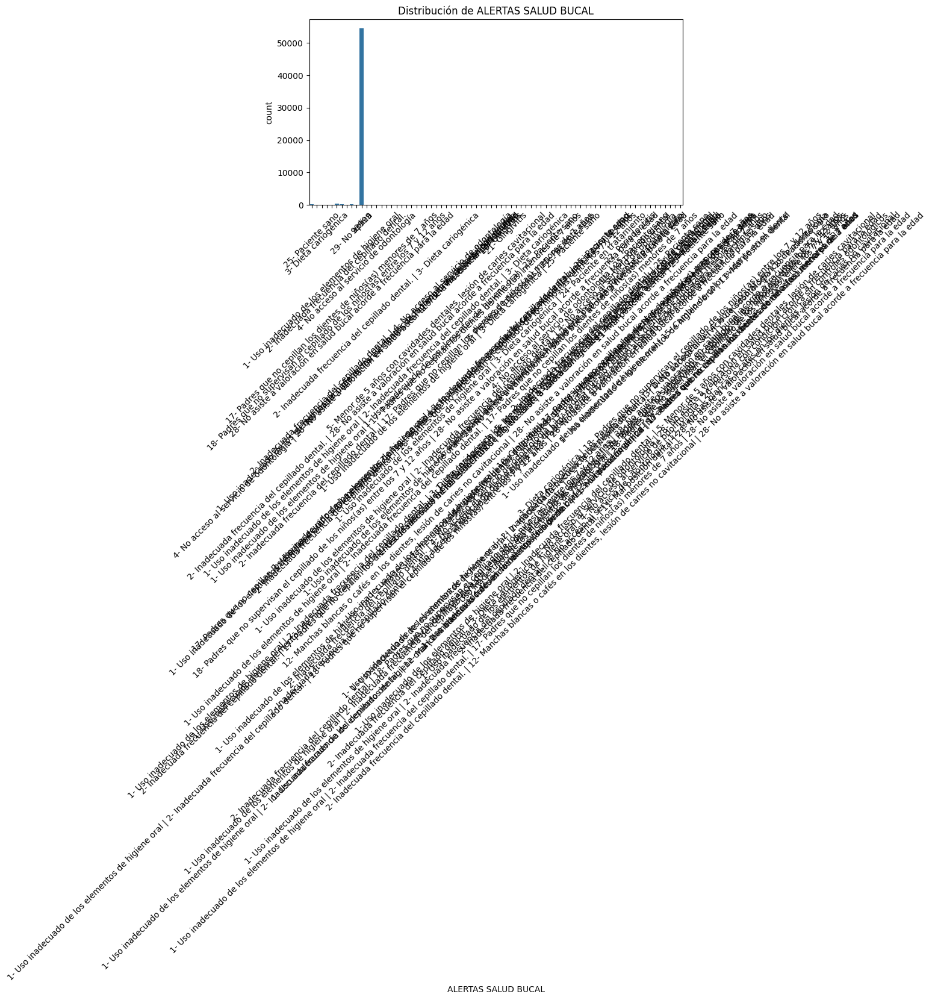

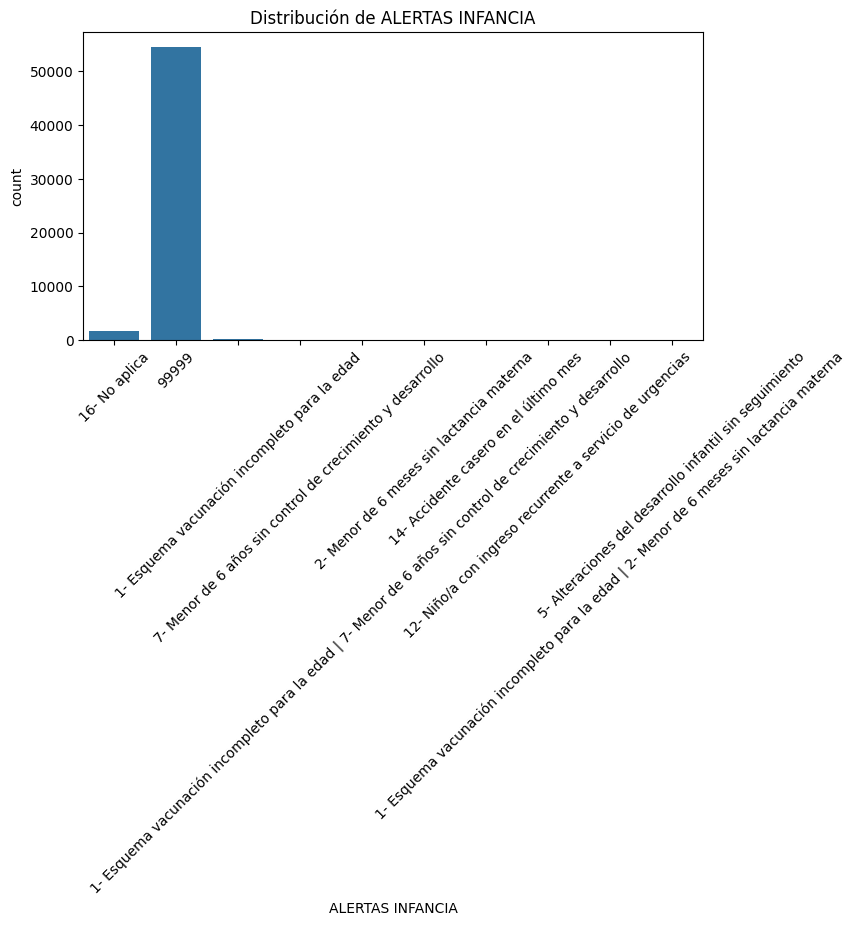

...

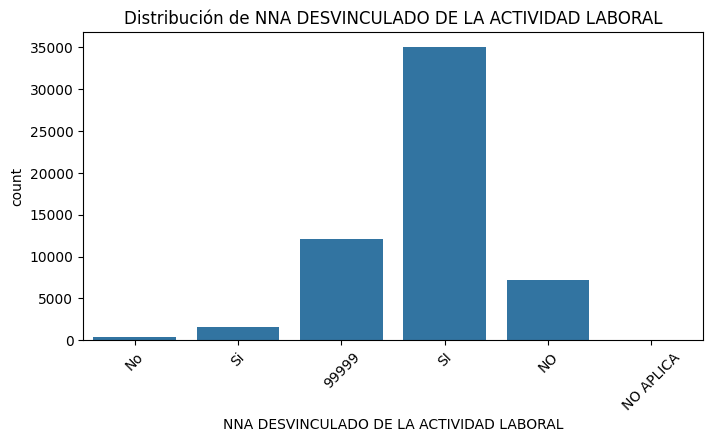

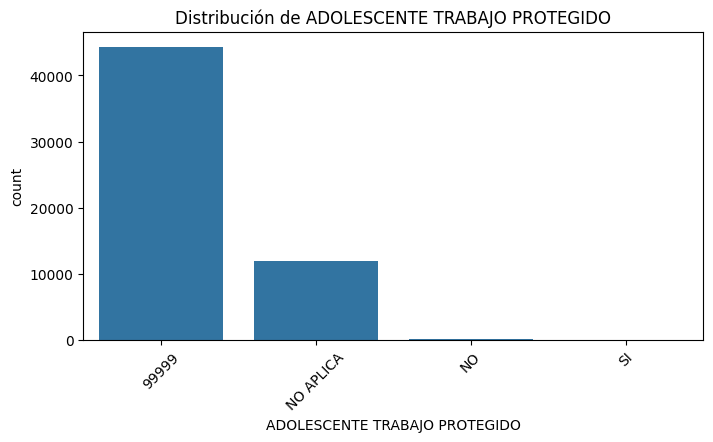

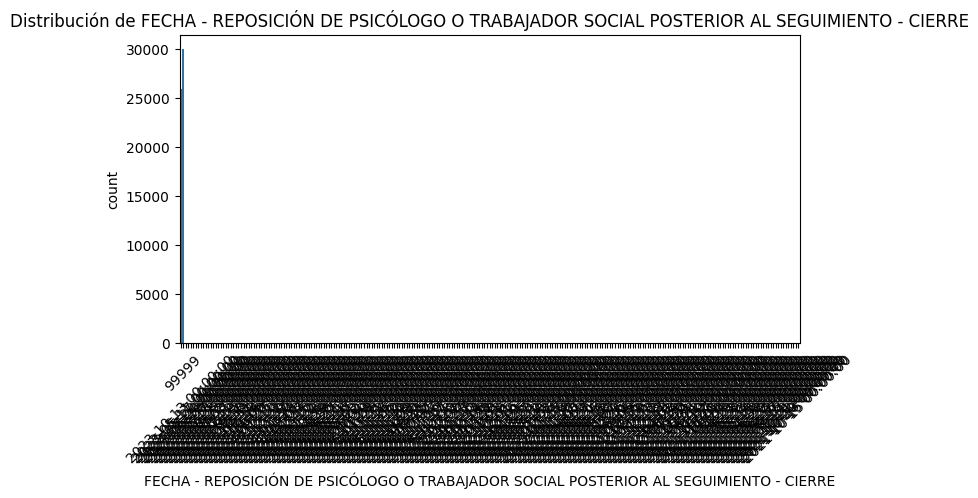

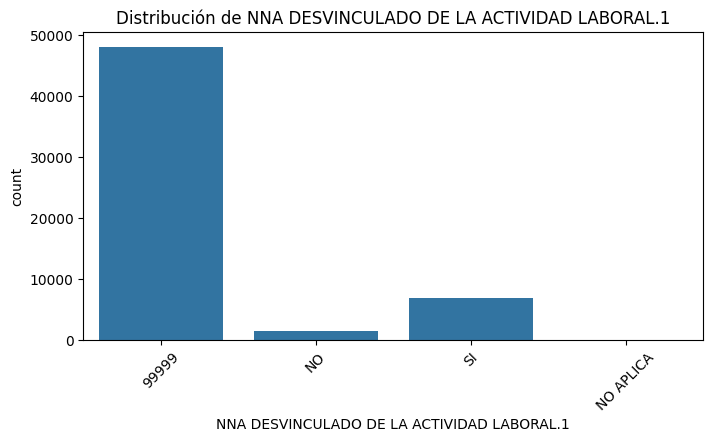

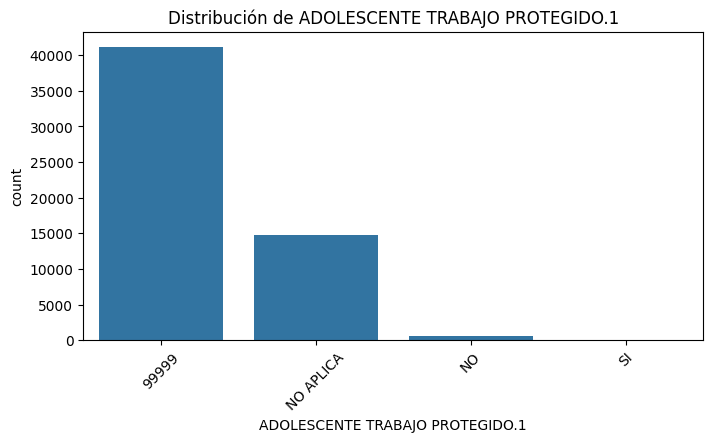

In [ ]:
print(f"\n{'='*70}")
print("🔖 DISTRIBUCIONES DE VARIABLES CATEGÓRICAS:")
print(f"{'='*70}")

for col in df.select_dtypes(include=['object', 'category']).columns:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=df, x=col)
    plt.title(f"Distribución de {col}")
    plt.xticks(rotation=45)
    plt.show()

In [20]:
temporales = df.select_dtypes(include=['datetime64']).columns

print(f"\n{'='*70}")
print("🔖 IDENTIFICACIÓN DE VARIABLES TEMPORALES:")
print(f"{'='*70}")
print("Columnas temporales:", temporales)


🔖 IDENTIFICACIÓN DE VARIABLES TEMPORALES:
Columnas temporales: Index(['Fecha_intervencion'], dtype='object')


In [21]:
print(f"\n{'='*70}")
print("🔖 MÍNIMO Y MÁXIMO DE COLUMNAS TEMPORALES:")
print(f"{'='*70}")
for col in df.select_dtypes(include=['datetime64']).columns:
    print(f"\nColumna: {col}")
    print("Mínimo:", df[col].min())
    print("Máximo:", df[col].max())


🔖 MÍNIMO Y MÁXIMO DE COLUMNAS TEMPORALES:

Columna: Fecha_intervencion
Mínimo: 2021-03-13 00:00:00
Máximo: 2025-03-31 00:00:00


In [24]:
geograficas = [col for col in df.columns if 'lat' in col.lower() or 'lon' in col.lower() or 'long' in col.lower() or 'ubicacion' in col.lower()]

print(f"\n{'='*70}")
print("🔖 IDENTIFICACIÓN DE VARIABLES GEOGRÁFICAS:")
print(f"{'='*70}")
print("Columnas geográficas:", geograficas)

print(" En principio, no parecen reconocerse variables de carácter geógrafico. Al menos en su tipo. Puede requerir transformación.")


🔖 IDENTIFICACIÓN DE VARIABLES GEOGRÁFICAS:
Columnas geográficas: []
 En principio, no parecen reconocerse variables de carácter geógrafico. Al menos en su tipo. Puede requerir transformación.


4. Verificación de la calidad de los datos

In [29]:
missing_data = df.isnull().sum()

print(f"\n{'='*70}")
print("🔖 CANTIDAD DE DATOS FALTANTES POR VARIABLE:")
print(f"{'='*70}")
print("Datos faltantes por columna:")
print(missing_data[missing_data > 0])

print("La variable que contiene el mayor número de datos faltantes es CUMPLIÓ, con 338 valores faltantes.")
print("La segunda es CUMPLIÓ.3, con 223 valores faltantes.")


🔖 CANTIDAD DE DATOS FALTANTES POR VARIABLE:
Datos faltantes por columna:
NOMBRE EAPB       12
BARRIO             5
NOMBRE EAPB.1     13
CUMPLIÓ          338
CUMPLIÓ.1         84
CUMPLIÓ.2         23
CUMPLIÓ.3        223
dtype: int64
La variable que contiene el mayor número de datos faltantes es CUMPLIÓ, con 338 valores faltantes.
La segunda es CUMPLIÓ.3, con 223 valores faltantes.


In [27]:
duplicates = df.duplicated().sum()

print(f"\n{'='*70}")
print("🔖 CANTIDAD DE DUPLICADOS:")
print(f"{'='*70}")
print(f"Número de filas duplicadas: {duplicates}")


🔖 CANTIDAD DE DUPLICADOS:
Número de filas duplicadas: 3690


In [30]:
duplicated_rows = df[df.duplicated(keep=False)]

print(f"\n{'='*70}")
print("🔖 IDENTIFICACIÓN DE FILAS DUPLICADAS:")
print(f"{'='*70}")
print("Filas duplicadas:")
print(duplicated_rows)


🔖 IDENTIFICACIÓN DE FILAS DUPLICADAS:
Filas duplicadas:
       Id_fic       Base_Origen    Ficha_fic Fecha_intervencion  \
36416  340725  nov21_sep08_2022   1120221687         2021-11-05   
36417  340725  nov21_sep08_2022   1120221687         2021-11-05   
36419  340865  nov21_sep08_2022   1120221688         2021-11-05   
36420  340865  nov21_sep08_2022   1120221688         2021-11-05   
36423  340932  nov21_sep08_2022   1120221689         2021-11-05   
...       ...               ...          ...                ...   
47567  575721  nov21_sep08_2022  40702210705         2022-09-06   
47568  575721  nov21_sep08_2022  40702210705         2022-09-06   
47569  575721  nov21_sep08_2022  40702210705         2022-09-06   
47570  575736  nov21_sep08_2022  40702210706         2022-09-06   
47571  575736  nov21_sep08_2022  40702210706         2022-09-06   

        Localidad_fic Red_fic               Usuario TIPO_INTERVENCION PERFIL  \
36416  Barrios Unidos       1         saballesteros       